<a href="https://colab.research.google.com/github/smesindianou/homeworks/blob/main/Cosine%20Similarity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !python -m spacy download el_core_news_sm

In [ ]:
import pandas as pd
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [ ]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
all_df = pd.read_csv('/content/drive/MyDrive/ΓΥΝΑΙΚΟΚΤΟΝΙΑ_Ε_P/all/all_mme_data.csv')
all_df.head()

,date,text,section,Μέσο
0,2025-06-04,Γυναικοκτονία Κυριακής Γρίβα: Διεκόπη για τις ...,Κοινωνια,Athens Voice
1,2025-06-04,Γυναικοκτονία Κυριακής Γρίβα: Για τις 30 Ιουνί...,Κοινωνία,Το ΒΗΜΑ
2,2025-06-03,Διπλή γυναικοκτονία στην Κηφισιά: 25 σφαίρες γ...,Κοινωνια,Athens Voice
3,2025-06-03,Γυναικοκτονία Κυριακής Γρίβα: Ηχητικό ντοκουμέ...,Κοινωνια,Athens Voice
4,2025-06-01,Άγιοι Ανάργυροι: Την Τετάρτη στις δικαστικές α...,Ελλάδα,The Toc


In [ ]:
all_df['date'] = pd.to_datetime(all_df['date'])

In [ ]:
all_df['year'] = all_df['date'].dt.year

In [ ]:
all_df.head()

,date,text,section,Μέσο,year
0,2025-06-04,Γυναικοκτονία Κυριακής Γρίβα: Διεκόπη για τις ...,Κοινωνια,Athens Voice,2025
1,2025-06-04,Γυναικοκτονία Κυριακής Γρίβα: Για τις 30 Ιουνί...,Κοινωνία,Το ΒΗΜΑ,2025
2,2025-06-03,Διπλή γυναικοκτονία στην Κηφισιά: 25 σφαίρες γ...,Κοινωνια,Athens Voice,2025
3,2025-06-03,Γυναικοκτονία Κυριακής Γρίβα: Ηχητικό ντοκουμέ...,Κοινωνια,Athens Voice,2025
4,2025-06-01,Άγιοι Ανάργυροι: Την Τετάρτη στις δικαστικές α...,Ελλάδα,The Toc,2025


In [ ]:
all_2024 = all_df[all_df['year'] == 2024]
all_2024['Μέσο'].unique()

array(['Athens Voice', 'The Toc', 'Ναυτεμπορική', 'Καθημερινή', 'Το ΒΗΜΑ'],
      dtype=object)

In [ ]:
av_2024 = all_2024[all_2024['Μέσο'] == 'Athens Voice']
av_2024.head()

,date,text,section,Μέσο,year
107,2024-12-31,Ανασκόπηση 2024: 16 γυναικοκτονίες μετά Ανασκό...,Ελλαδα,Athens Voice,2024
112,2024-12-09,Φλωρίδης: Δεν θα μπει ο όρος γυναικοκτονία στο...,Πολιτικη & Οικονομια,Athens Voice,2024
114,2024-12-09,Γυναικοκτονία στους Αμπελόκηπους: Την Τρίτη στ...,Κοινωνια,Athens Voice,2024
115,2024-12-08,Γυναικοκτονία στους Αμπελόκηπους: «Τρελάθηκα ό...,Κοινωνια,Athens Voice,2024
117,2024-12-07,Γυναικοκτονία στους Αμπελόκηπους: Την είχε σκο...,Κοινωνια,Athens Voice,2024


In [ ]:
av_2024 = av_2024.sort_values("date", ascending=False).reset_index(drop=True)

In [ ]:
tt_2024 = all_2024[all_2024['Μέσο'] == 'The Toc']
tt_2024.head()

,date,text,section,Μέσο,year
108,2024-12-30,Το τέλος του woke Ο χαρακτηρισμός της Ελλάδας ...,Opinion,The Toc,2024
116,2024-12-07,"Αμπελόκηποι: ""Θα μου χαλάσεις τη δουλειά"" - Η ...",Ελλάδα,The Toc,2024
124,2024-12-06,Γυναικοκτονία στους Αμπελόκηπους: Τα παιδιά κο...,Ελλάδα,The Toc,2024
127,2024-12-06,"Γυναικοκτονία στους Αμπελόκηπους: ""Μου είπε ότ...",Ελλάδα,The Toc,2024
128,2024-12-06,"Αμπελόκηποι: ""Δεν θα ξαναγυρίσω σπίτι"" - Παρίσ...",Ελλάδα,The Toc,2024


In [ ]:
tt_2024 = tt_2024.sort_values("date", ascending=False).reset_index(drop=True)

In [ ]:
tt_2024.head()

,date,text,section,Μέσο,year
0,2024-12-30,Το τέλος του woke Ο χαρακτηρισμός της Ελλάδας ...,Opinion,The Toc,2024
1,2024-12-07,"Αμπελόκηποι: ""Θα μου χαλάσεις τη δουλειά"" - Η ...",Ελλάδα,The Toc,2024
2,2024-12-06,Γυναικοκτονία στους Αμπελόκηπους: Τα παιδιά κο...,Ελλάδα,The Toc,2024
3,2024-12-06,"Γυναικοκτονία στους Αμπελόκηπους: ""Μου είπε ότ...",Ελλάδα,The Toc,2024
4,2024-12-06,"Αμπελόκηποι: ""Δεν θα ξαναγυρίσω σπίτι"" - Παρίσ...",Ελλάδα,The Toc,2024


In [ ]:
vima_2024 = all_2024[all_2024['Μέσο'] == 'Το ΒΗΜΑ']
vima_2024.head()

,date,text,section,Μέσο,year
118,2024-12-07,Είναι σκόπιμο να αναγνωριστεί νομικά η γυναικο...,Γνώμες,Το ΒΗΜΑ,2024
120,2024-12-06,Γυναικοκτονία στους Αμπελόκηπους: Νέα στοιχεία...,Κοινωνία,Το ΒΗΜΑ,2024
122,2024-12-06,Γυναικοκτονία στους Αμπελόκηπους: Ποινική δίωξ...,Δικαιοσύνη,Το ΒΗΜΑ,2024
139,2024-12-03,Γυναικοκτονία στη Θεσσαλονίκη: «Έσπασε τις κάμ...,Κοινωνία,Το ΒΗΜΑ,2024
140,2024-12-02,«Τον αδερφό μου ήθελε» – Νέα στοιχεία για τη γ...,Κοινωνία,Το ΒΗΜΑ,2024


In [ ]:
vima_2024 = vima_2024.sort_values("date", ascending=False).reset_index(drop=True)

In [ ]:
vima_2024.head()

,date,text,section,Μέσο,year
0,2024-12-07,Είναι σκόπιμο να αναγνωριστεί νομικά η γυναικο...,Γνώμες,Το ΒΗΜΑ,2024
1,2024-12-06,Γυναικοκτονία στους Αμπελόκηπους: Νέα στοιχεία...,Κοινωνία,Το ΒΗΜΑ,2024
2,2024-12-06,Γυναικοκτονία στους Αμπελόκηπους: Ποινική δίωξ...,Δικαιοσύνη,Το ΒΗΜΑ,2024
3,2024-12-03,Γυναικοκτονία στη Θεσσαλονίκη: «Έσπασε τις κάμ...,Κοινωνία,Το ΒΗΜΑ,2024
4,2024-12-02,«Τον αδερφό μου ήθελε» – Νέα στοιχεία για τη γ...,Κοινωνία,Το ΒΗΜΑ,2024


In [ ]:
# φτιάχνω ένα text για την Athens Voice με συνένωση των κειμένων ολων των άρθρων του 2024
av_2024 = av_2024['text'].str.cat(sep = ' ')
av_2024[:665] # με το [:665] θα δω τους 665 πρώτους χαρακτήρες του συνενωμένου κειμένου

'Ανασκόπηση 2024: 16 γυναικοκτονίες μετά Ανασκόπηση 2024: Οι γυναικοκτονίες του έτους που βύθισαν στο πένθος οικογένειες και κοινή γνώμηΥπήρξε μέρα του 2024 που δολοφονήθηκαν δύο γυναίκες με διαφορά ωρών Ο άγραφος κανόνας στις αίθουσες σύνταξης ανά τον κόσμο θέλει την ανασκόπηση των γυναικοκτονιών να τυπώνεται ή να δημοσιεύεται τελευταία, δίπλα στα μεγάλα γεγονότα του έτους, τους διάσημους θανάτους, τις σταθερά λιγοστές χαρμόσυνες ειδήσεις. Ο λόγος αυτής της καθυστέρησης οφείλεται στη ζοφερή πραγματικότητα που θέλει τις γιορτινές μέρες να εντείνονται τα φαινόμενα ενδοοικογενειακής βίας, κάποτε με τραγική κατάληξη, και τη λίστα των δολοφονημένων γυναικών να μ'

In [ ]:
# φτιάχνω ένα text για τo The Toc με συνένωση των κειμένων ολων των άρθρων του 2024
tt_2024 = tt_2024['text'].str.cat(sep = ' ')
tt_2024[:665] # με το [:665] θα δω τους 665 πρώτους χαρακτήρες του συνενωμένου κειμένου

'Το τέλος του woke Ο χαρακτηρισμός της Ελλάδας ως χώρα της φαιδράς πορτοκαλέας δικαιώνεται ακόμα, καθημερινά. Στην Αμερική οι woke ηττήθηκαν από τον Τραμπ. Εδώ από τον Καζαντζίδη. Ο νεαρός μου φίλος είναι μορφωμένος, εύγλωττος, το πιο σημαντικό δε παθιασμένος. Έχει ιδιοσυγκρασία "polemicist” όπως το λένε οι αγγλοσάξονες. Ανάγκη να εξανίσταται, να συγκρούεται, να μάχεται για ό,τι θεωρεί σωστό και δίκαιο. Λυμένο το ζωνάρι, ακονισμένα τα νύχια του, πιάνει φωτιά το πληκτρολόγιό του τουλάχιστον δις εβδομαδιαίως από καβγάδες με ιδεολογικούς του αντιπάλους. Ο πιο πρόσφατος στόχος του έχει πεθάνει εδώ και εικοσιπέντε χρόνια. Ονομάζεται Στέλιος Καζαντζίδης. "Επιχειρε'

In [ ]:
# φτιάχνω ένα text για τo ΒΗΜΑ με συνένωση των κειμένων ολων των άρθρων του 2024
vima_2024 = vima_2024['text'].str.cat(sep = ' ')
vima_2024[:665] # με το [:665] θα δω τους 665 πρώτους χαρακτήρες του συνενωμένου κειμένου

'Είναι σκόπιμο να αναγνωριστεί νομικά η γυναικοκτονία ως έγκλημα; Μόνο αν υπάρχει η επαρκής μορφωτική διαπαιδαγώγηση ήδη από τα σχολεία για το ότι οι γυναίκες είναι ισότιμα (με τους άνδρες) ανθρώπινα όντα μπορούμε να ελπίζουμε σε μια υπέρβαση του φρικτού φαινομένου. Πριν από λίγες ημέρες στη Θεσσαλονίκη ένας 46χρονος δολοφόνησε την 60χρονη γυναίκα του (μητέρα έξι παιδιών) λόγω ερωτικής αντιζηλίας. Επίσης μόλις προχθές στην Αθήνα άλλος σύζυγος δολοφόνησε τη γυναίκα του και έβαλε το πτώμα στο πατάρι.Όλα αυτές οι δολοφονίες μάς σοκάρουν και μας θυμίζουν τα λόγια του μεγάλου συγγραφέα Άρθουρ Κέσλερ (« Το μηδέν και το άπειρο»). Δηλαδή, ότι ο ανθρώπινος εγκέφαλος '

In [ ]:
two_sites_list_av = [] # φτιάχνω μια λίστα για να βάλω μέσα τα dictionaries που φτιάχνω παρακάτω
ttD = {'site' : 'The Toc', 'text' : tt_2024} # φτιάχνω dictionary για τo ertnews.gr
two_sites_list_av.append(ttD) # βάζω το dictionary στη λίστα
avD = {'site' : 'Athens Voice', 'text' : av_2024} # φτιάχνω dictionary για το in.gr
two_sites_list_av.append(avD) # βάζω το dictionary στη λίστα
two_sites_av_df = pd.DataFrame(two_sites_list_av) # φτιάχνω dataframe από τη λίστα με τα δύο dictionaries
two_sites_av_df

,site,text
0,The Toc,Το τέλος του woke Ο χαρακτηρισμός της Ελλάδας ...
1,Athens Voice,Ανασκόπηση 2024: 16 γυναικοκτονίες μετά Ανασκό...


In [ ]:
tfidf_vectorizer_av = TfidfVectorizer(stop_words= list(nlp.Defaults.stop_words), max_features=500)
tfidf_matrix_train_av = tfidf_vectorizer_av.fit_transform(two_sites_av_df['text'])

In [ ]:
arr = cosine_similarity(tfidf_matrix_train_av, tfidf_matrix_train_av)
print("cosine scores ==> ", arr)

cosine scores ==>  [[1.         0.78757433]
 [0.78757433 1.        ]]


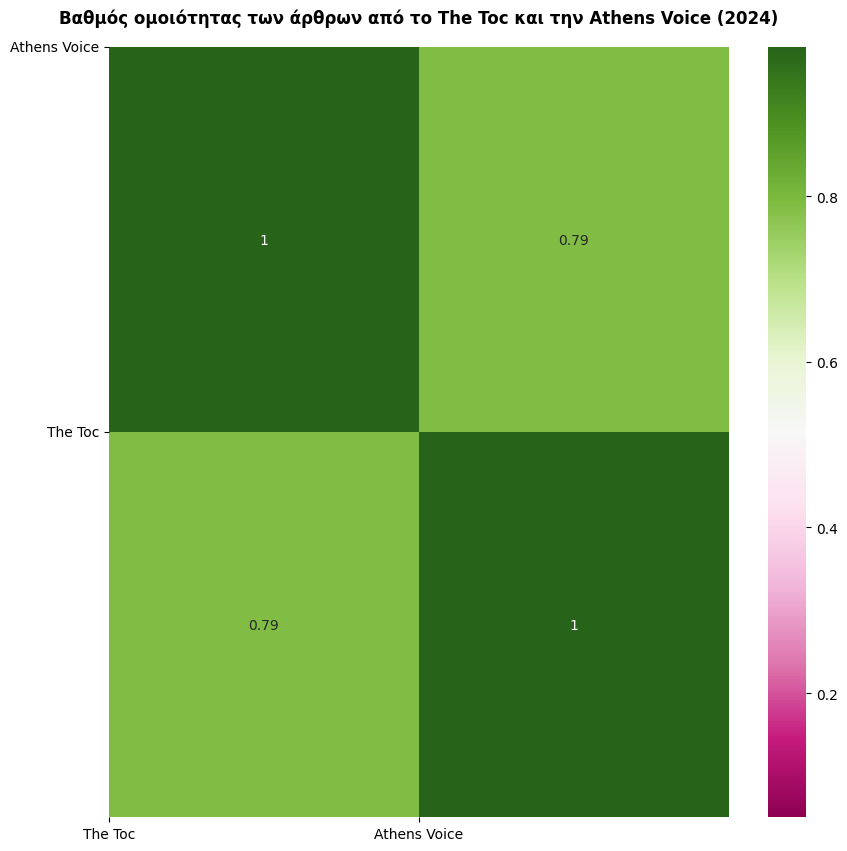

In [ ]:
plt.figure(figsize=(10, 10))
plt.title('Βαθμός ομοιότητας των άρθρων από το The Toc και την Athens Voice (2024)', y=1.02, fontweight='bold') # το y ορίζει την απόσταση του τίτλου από το γράφημα
sns.heatmap(data=arr, annot=True, vmin=0.05, vmax=0.98, cmap="PiYG") # το vmin και το vmax ορίζουν πάνω και κάτω από ποιο αριθμό ομοιότητας θα εμφανίζεται το ντεγκραντέ των δύο ακραίων χρωμάτων
plt.xticks([0, 1], ['The Toc', 'Athens Voice']) # ορίζω να εμφανίζονται τα ονόματα των sites αντί για το 0 και 1 του index, στον άξονα x
plt.yticks([0, 1], ['Athens Voice', 'The Toc'], rotation=0) # ορίζω να εμφανίζονται τα ονόματα των sites αντί για το 0 και 1 του index, στον άξονα y - με το rotation=0 κάνω τα ονόματα των sites στον άξονα y να εμφανίζονται οριζόντια
plt.savefig('/content/drive/MyDrive/ΓΥΝΑΙΚΟΚΤΟΝΙΑ_Ε_P/all/heatmap_av.png') # αποθηκεύω την εικόνα του γραφήματος στο drive

In [ ]:
two_sites_list = [] # φτιάχνω μια λίστα για να βάλω μέσα τα dictionaries που φτιάχνω παρακάτω
ttD = {'site' : 'The Toc', 'text' : tt_2024} # φτιάχνω dictionary για τo ertnews.gr
two_sites_list.append(ttD) # βάζω το dictionary στη λίστα
vimaD = {'site' : 'Το ΒΗΜΑ', 'text' : vima_2024} # φτιάχνω dictionary για το in.gr
two_sites_list.append(vimaD) # βάζω το dictionary στη λίστα
two_sites_df = pd.DataFrame(two_sites_list) # φτιάχνω dataframe από τη λίστα με τα δύο dictionaries
two_sites_df

/usr/local/lib/python3.11/dist-packages/google/colab/_dataframe_summarizer.py:57: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(column, errors="raise")


,site,text
0,The Toc,Το τέλος του woke Ο χαρακτηρισμός της Ελλάδας ...
1,Το ΒΗΜΑ,Είναι σκόπιμο να αναγνωριστεί νομικά η γυναικο...


In [ ]:
tfidf_vectorizer = TfidfVectorizer(stop_words= list(nlp.Defaults.stop_words), max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(two_sites_df['text'])

In [ ]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)
print("cosine scores ==> ", arr)

cosine scores ==>  [[1.         0.74974782]
 [0.74974782 1.        ]]


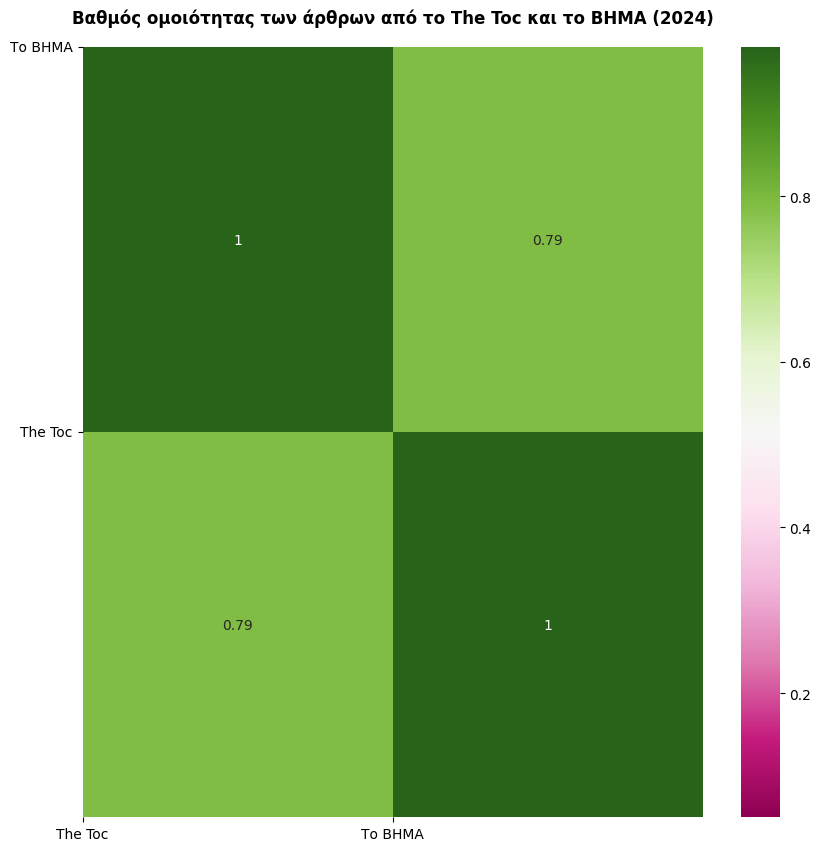

In [ ]:
plt.figure(figsize=(10, 10))
plt.title('Βαθμός ομοιότητας των άρθρων από το The Toc και το ΒΗΜΑ (2024)', y=1.02, fontweight='bold') # το y ορίζει την απόσταση του τίτλου από το γράφημα
sns.heatmap(data=arr, annot=True, vmin=0.05, vmax=0.98, cmap="PiYG") # το vmin και το vmax ορίζουν πάνω και κάτω από ποιο αριθμό ομοιότητας θα εμφανίζεται το ντεγκραντέ των δύο ακραίων χρωμάτων
plt.xticks([0, 1], ['The Toc', 'Το ΒΗΜΑ']) # ορίζω να εμφανίζονται τα ονόματα των sites αντί για το 0 και 1 του index, στον άξονα x
plt.yticks([0, 1], ['Το ΒΗΜΑ', 'The Toc'], rotation=0) # ορίζω να εμφανίζονται τα ονόματα των sites αντί για το 0 και 1 του index, στον άξονα y - με το rotation=0 κάνω τα ονόματα των sites στον άξονα y να εμφανίζονται οριζόντια
plt.savefig('/content/drive/MyDrive/ΓΥΝΑΙΚΟΚΤΟΝΙΑ_Ε_P/all/heatmap.png') # αποθηκεύω την εικόνα του γραφήματος στο drive